<p>
<h1><b><center></center></b></h1>
<center><img src="https://drive.google.com/uc?id=1UJc1ci41G6ahJ7ProKvunUOIBcTXZ6ZG" align="center" width="550"></center>
</p>
<h1><b><center>Relatividad y Gravitación</center></b></h1>
<h2><b><center>Prof. Jorge I. Zuluaga</center></b></h1>
<h2><b><center>Problem Set 5</center></b><h2>
<h3><b><center>Dinámica Relativista</center></b><h3>
<h5><center><b>Asignada</b>: Jueves 10 de Octubre de 2024</center><h5>
<h5><center><b>Entrega</b>: Jueves 17 de Octubre de 2024</center><h5>

**NOTA**: Al inicio de la solución entregada debe incluir una relación de los puntos y los literales que resolvió completamente.

A continuación se presentan un conjunto de ejercicios o problemas para resolver usando la teoría vista en las últimas lecciones del curso. Resuelva los ejercicios *a mano* y suba una versión digitalizada en el espacio del ítem respectivo en Google Classroom.


##**Solucionado** $\checkmark$

1. **Transformación de la trifuerza**. Partiendo de la definición de cuadrifuerza y usando las transformaciones generales para un cuadrivector:

  a. Probar que la fuerza resultante experimentada por un cuerpo transforma de acuerdo a:

  \begin{aligned}
  F_{\|}&=D'\left(F_{L \|}^{\prime}+u_L \vec{v}_L^\prime \cdot \vec{F}_L^{\prime}\right) \\
  F_{\perp}&=\frac{D'}{\gamma_u}F_{L \perp}^{\prime}
  \end{aligned}
  donde $D'=1/(1+\vec{v}_L^{\prime} \cdot \vec{u}_L)$.

  b. Escriba las transformadas en el sistema internacional de unidades explicando detalladamente cómo se convierte de unidades luz a unidades en el sistema internacional.

  c. Haga un código interactivo que permita variar las componentes x, y de una fuerza y su magnitud, tal y como son vistas en el sistema de referencia propio de una partícula. A continuación agregue un control que permita variar las componentes x, y de la velocidad de la partícula respecto al sistema de referencia del laboratorio y finalmente la rapidez $u_L$ del sistema de referencia de un experimento (que se asume se mueve en dirección del eje x).  Dibuje en el diagrama los vectores de fuerza: observada en el sistema de referencia de la partícula (aquel en el que ella esta quieta), en el sistema de referencia del experimento (aquel en el que la partícula tiene velocidad $\vec v_L^\prime$) y en el sistema de referencia del laboratorio (aquel en el que el sistema de referencia del experimento tiene velocidad $\vec u_L$ y la partícula $\vec v_L$).   

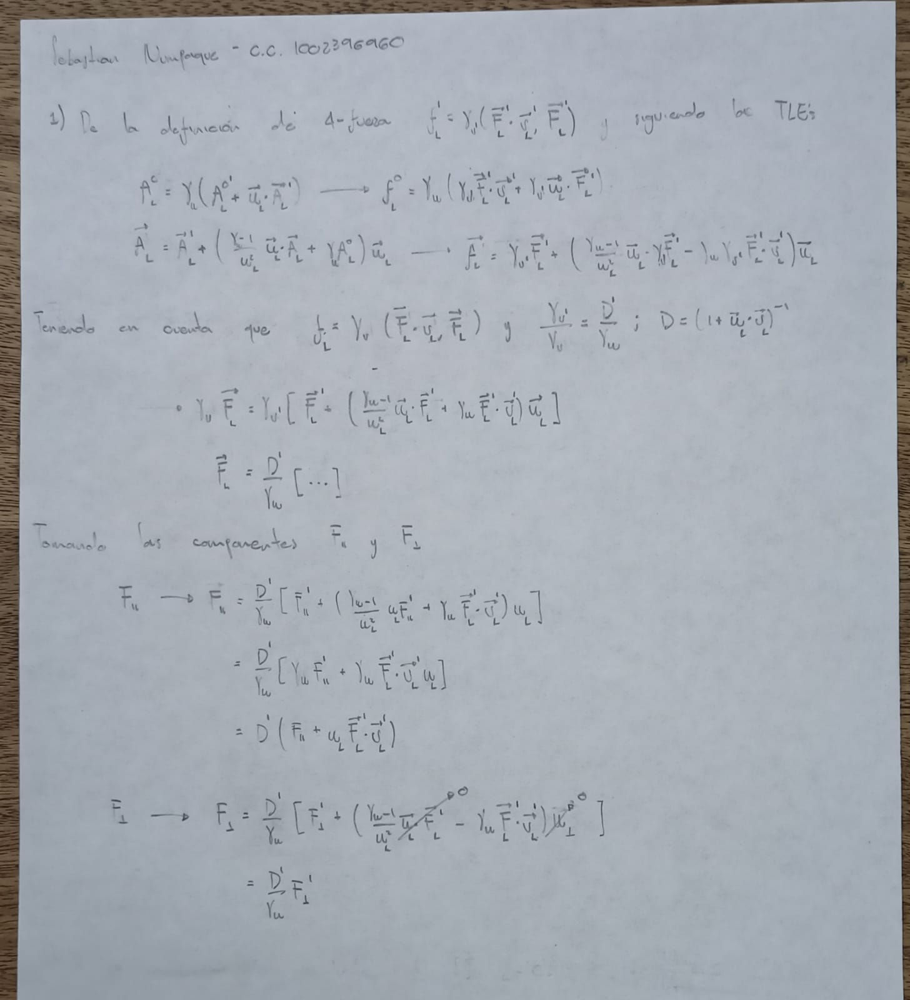

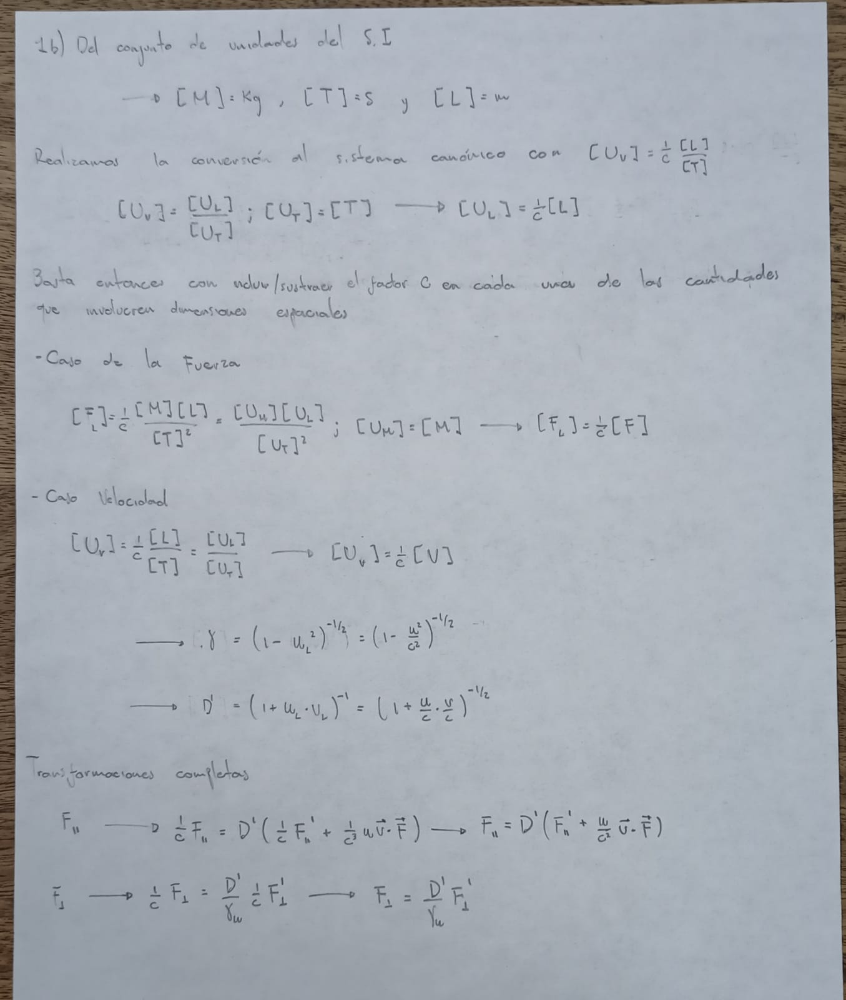

##**Función** `transform_vector`

Emplea la transformación general de Lorentz-Einsteins sobre los 4-Vectores

$$\vec{A}^{\prime} =\frac{1}{\gamma_u(1-\vec{u} \cdot \vec{v})}\left[\vec{A}+\left(\frac{\gamma_u-1}{u^2} \vec{u} \cdot \vec{A}-\gamma_u A^0\right) \vec{u}\right]$$

**Nota:** La función soporta transformaciones inversas $\vec{u_L}\to -\vec{u_L}$

##**Función** `plot_forces`

Visualización de transformación de fuerzas.

**Nota:** Se emplean las siguientes transformaciones

$$\vec{v_L}\,\xrightarrow{\vec{u_L}}\,\vec{v_L}'$$

$$\vec{F_{L}}_{particle}\,\xrightarrow{-\vec{v_L'}}\,\vec{F_L'}\,\xrightarrow{-\vec{u_L}}\,\vec{F_L}$$

In [ ]:
import numpy as np

import plotly.graph_objects as go
from plotly.figure_factory import create_quiver

from ipywidgets import interactive, FloatSlider, IntSlider

from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
# 4Vector Lorentz-Einsteins Transformations
def transform_vector(uL_vec, vL_vec, A_vec, A0):

  uL = np.linalg.norm(uL_vec)
  gamma = (1 - uL**2)**-0.5
  D = 1/(1 - np.dot(vL_vec, uL_vec))

  A_vec_prime = D/gamma * (((gamma-1)*np.dot(A_vec,uL_vec)/uL**2 -
                            gamma*A0)*uL_vec + A_vec)

  return A_vec_prime


def plot_forces(uL, vL, theta_vL, FL_particle, theta_FL):

  # Lab Frame
  uL_vec = np.array([uL, 0])

  theta_vL *= np.pi/180
  vL_vec = vL*np.array([np.cos(theta_vL), np.sin(theta_vL)])

  # Particle Frame
  theta_FL *= np.pi/180
  FL_particle *= np.array([np.cos(theta_FL), np.sin(theta_FL)])

  # Lab to Experiment
  vL_prime = transform_vector(uL_vec, vL_vec, vL_vec, 1)

  #Particle to Experiment
  FL_prime = transform_vector(-vL_prime, np.zeros(2), FL_particle, 0)

  # Experiment to Lab
  FL = transform_vector(-uL_vec, vL_prime,
                        FL_prime, np.dot(vL_prime, FL_prime))

  # Plotting Forces
  fig = create_quiver(*np.zeros((2,1)), *FL.reshape(2,1),
                      line_width = 1, scale = 0.5,
                      arrow_scale = 0.1,
                      name = 'Lab')

  fig.add_traces(create_quiver(*np.zeros((2,1)),
                               *FL_prime.reshape(2,1),
                              line_width = 1, scale = 0.5,
                              arrow_scale = 0.1,
                              name = 'Experiment')['data'])

  fig.add_traces(create_quiver(*np.zeros((2,1)),
                               *FL_particle.reshape(2,1),
                              line_width = 1, scale = 0.5,
                              arrow_scale = 0.1,
                              name = 'Particle')['data'])


  fig.update_layout(width = 900, height = 600,
                    title_x = 0.5, title_y = 0.93,
                    yaxis_scaleanchor = "x",
                    title_text = 'Relativistic Forces Transformation',
                    xaxis_title = 'Fx [FL]',
                    yaxis_title = 'Fy [FL]',
                    legend = dict(orientation = 'h',
                                   x = 0.63, y = 1.08))

  fig.show()


In [ ]:
interactive(plot_forces,
            uL = FloatSlider(min = 0, max = 1, step = 0.1,
                              description = 'uL', value = 0.5,
                              continuous_update = False),
            vL = FloatSlider(min = 0, max = 1, step = 0.1,
                              description = 'vL', value = 0.5,
                              continuous_update = False),
            theta_vL = IntSlider(min = 0, max = 360, step = 10,
                                description = 'θ_vL', value = 30,
                                continuous_update = False),
            FL_particle = FloatSlider(min = 0, max = 1, step = 0.1,
                              description = 'uL', value = 0.5,
                              continuous_update = False),
            theta_FL = IntSlider(min = 0, max = 360, step = 10,
                                description = 'θ_FL', value = 30,
                                continuous_update = False))

interactive(children=(FloatSlider(value=0.5, continuous_update=False, description='uL', max=1.0), FloatSlider(…

##**Solucionado** $\checkmark$

2. **El efecto Compton**. Una de las más importantes aplicaciones de la dinámica relativista la demostró Arthur Compton en 1923 cuando, después de una serie histórica de experimentos usando rayos X, encontro que la luz cambiaba su energúa al dispersarse en un material siguiendo la relación:

  $$
  E_{\gamma^{\prime}}=\frac{E_\gamma}{1+\left(E_\gamma / m_{\mathrm{e}} c^2\right)(1-\cos \theta)}
  $$
  donde $\theta$ es el ángulo entre la dirección de la luz incidente y la dispersada, $E_\gamma$ es la energía de un fotón incidente y $m_e$ es la masa de un electrón. A este fenómeno se lo conoce como *efecto Compton* o *esparcimiento de Compton* (*Compton scattering*) o *desplazamiento de Compton*.

  Investigue cómo puede probarse esta relación usando el principio de conservación del cuadrimomentum y las propiedades de una partícula de masa nula como el fotón estudiadas en clase.

  Adicionalmente encuentre una fórmula para la energía del electrón después de ser empujado por el fotón en la colisión y demuestre que el ángulo en el que es dispersado es:

  $$
  \cot \varphi=\left(1+\frac{h f}{m_{\mathrm{e}} c^2}\right) \tan (\theta / 2)
  $$
  donde $h$ es la constante de Planck y $f$ la frecuencia del fotón incidente.

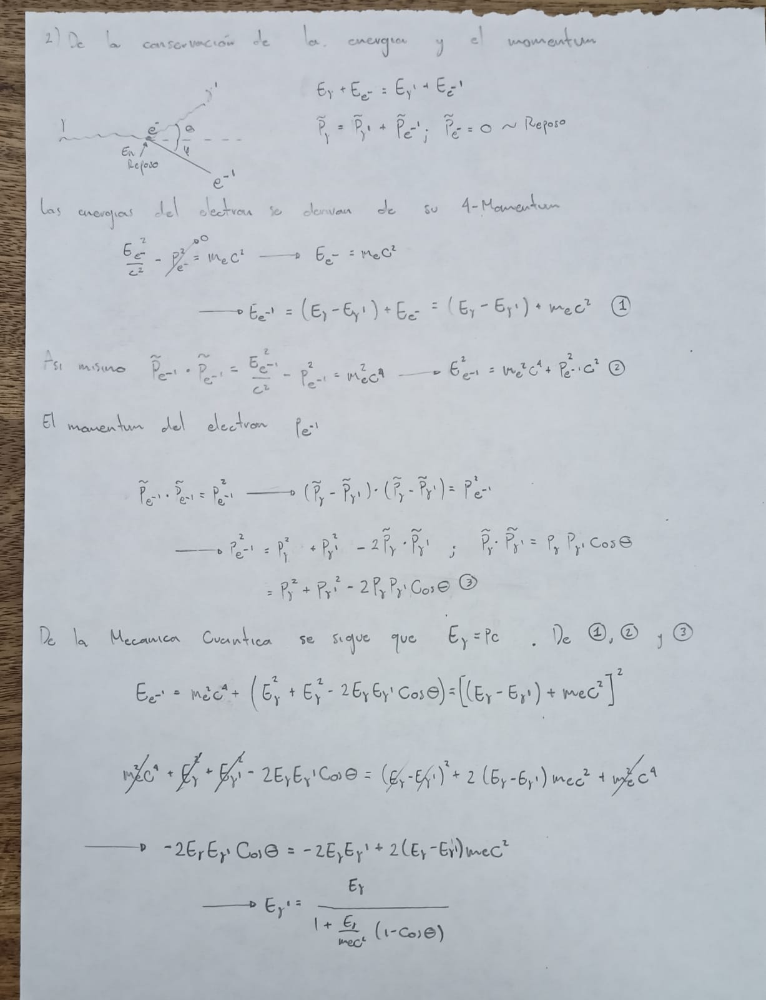

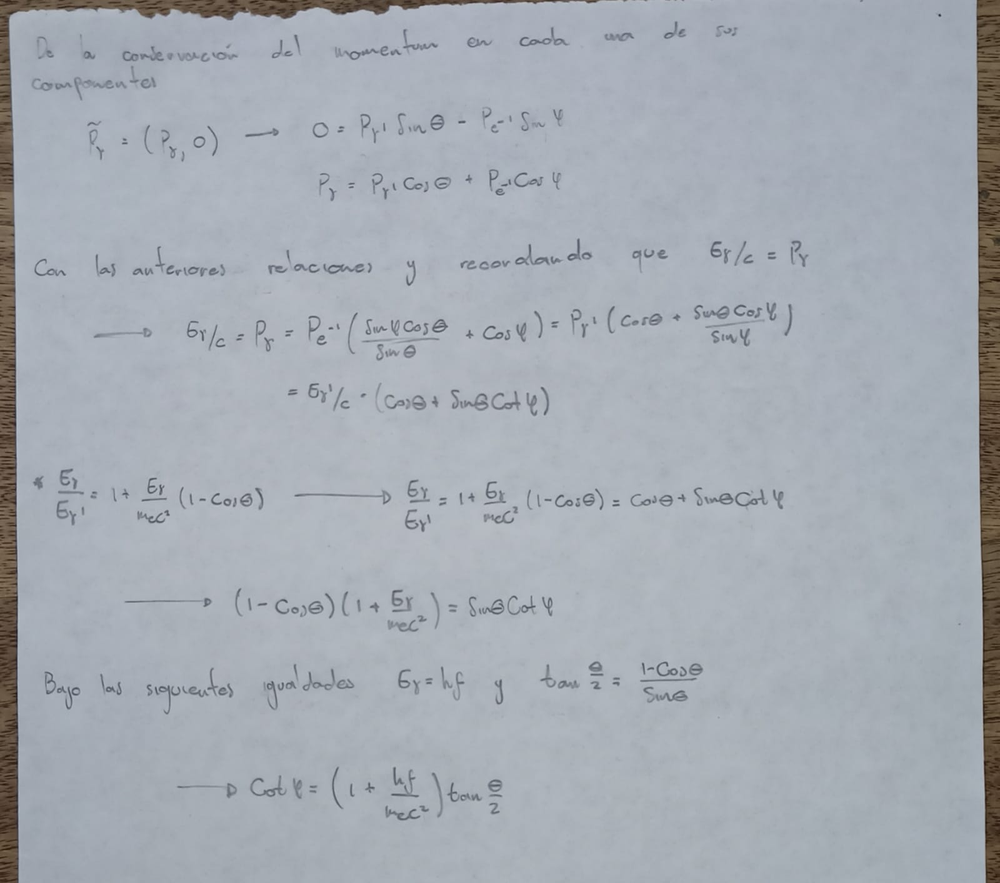

##**Solucionado** $\checkmark$

3. **Imposibilidades relativistas**. Demuestre que es imposible para un electrón aislado absorber o emitir un fotón de luz.

  **Sugerencia**: Use un diagrama espacio-temporal para probar que no es posible reconciliar el principio de conservación del cuadrimomentum en un proceso como este.

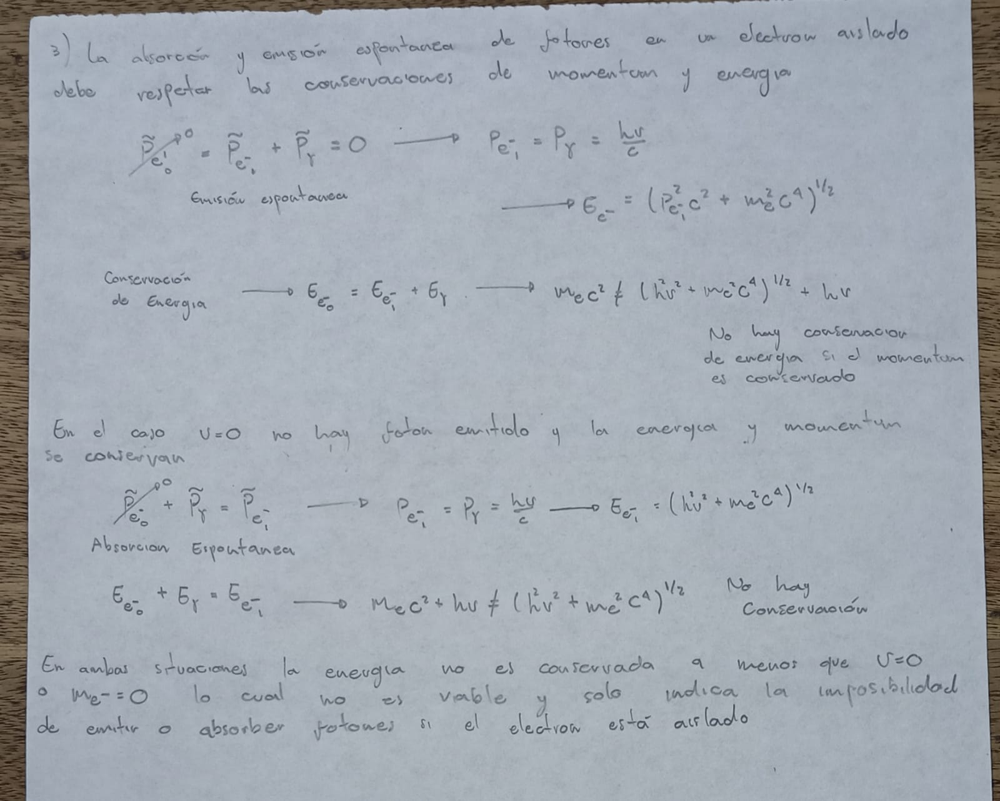

##**Solucionado** $\checkmark$

4. **Decaimiento $\beta$ de un neutrón**. El decaimiento $\beta$ de un neutrón es el proceso fundamental que permite establecer el equilibrio entre protones y neutrones en el universo primordial y en últimas determinar la abundancia de Helio en el universo después de la nucleosíntesis. La reacción básica del decaimiento es:

 $$
 n \rightarrow p^+ + e^- + \bar\nu_e
 $$
 donde $p^+$ es un protón ($m_p = 938.272$ MeV/c$^2$, $m_n = 939.565$ MeV/c$^2$), $e^-$ es un electrón ($m_e = 0.511$ MeV/c$^2$) y $\bar\nu_e$ es un antineutrino electrónico (asumiremos que $m_\nu \approx 0$).

 Investigaremos las condiciones de este proceso usando dinámica relativista. Para ello:

 a. Haga un gráfico en un diagrama espacio temporal del decaimiento de un neutrón en reposo. Por supuesto existen infinitas trayectorias resultantes de las tres partículas, represente una de ellas tratando de conservar adecuadamente la escala para que el cuadrimomentum se conserve.

 b. Use la idea de los diagramas en a, y la conservación del cuadrimomentum, para demostrar que es imposible que un neutrón decayerá únicamente en un protón y un electrón. Esta fue la manera en la que Enrico Fermi predijo la existencia del neutrino.

 c. Calcule la energía mínima y máxima que puede tener el neutrino en el decaimiento beta. Explique su respuesta en detalle usando argumentos basados en la conservación del cuadrimomentum.

 d. El electrón emitido en un decaimiento $\beta$ puede salir, en el sistema de referencia propio del neutrón, con igual probabilidad en cualquier dirección (el decaimiento isotrópico). Demuestre que en un diagrama $p_x-p_y$ (sistema de referencia del laboratorio) el extremo del momentum lineal del electrón que es emitido por un neutrón que se mueve con velocidad $v$ en dirección de x, esta sobre una elipse con semieje mayor $\gamma_v p'$ y semiejemenor $p'$, y con centro en el punto $(\gamma v E'/c^2,0)$ , donde $p'$ es la magnitud del momentum lineal del electrón y $E'$ su energía, tal y como son medidos en el sistema de referencia del neutron.

 e. Haga un dibujo de las elipses encontradas en el literal d para los casos en los que $vE'/c^2 > p'$, $vE'/c^2 = p'$ y $vE'/c^2 < p'$ e interprete sus resultados.

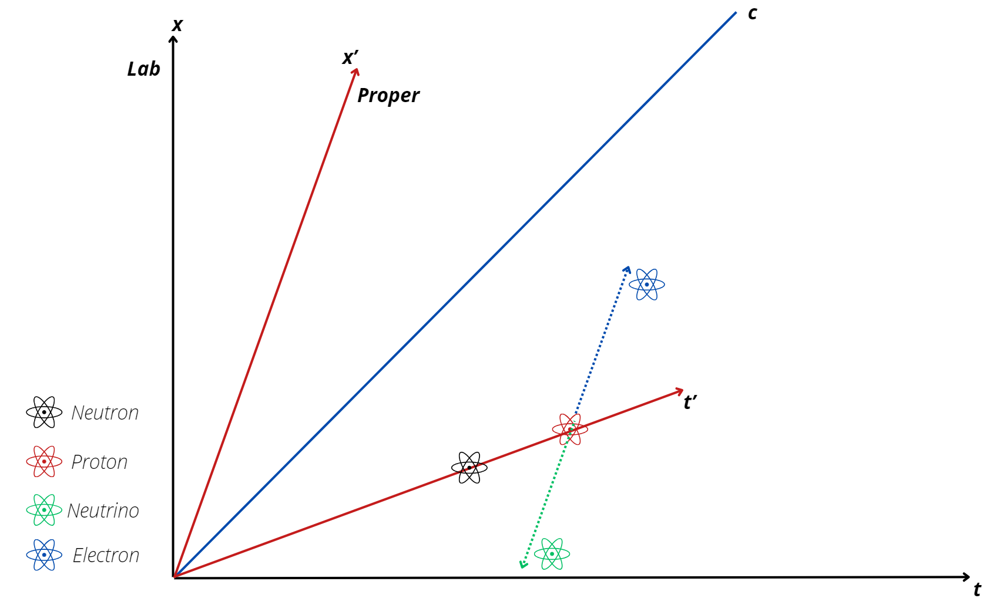

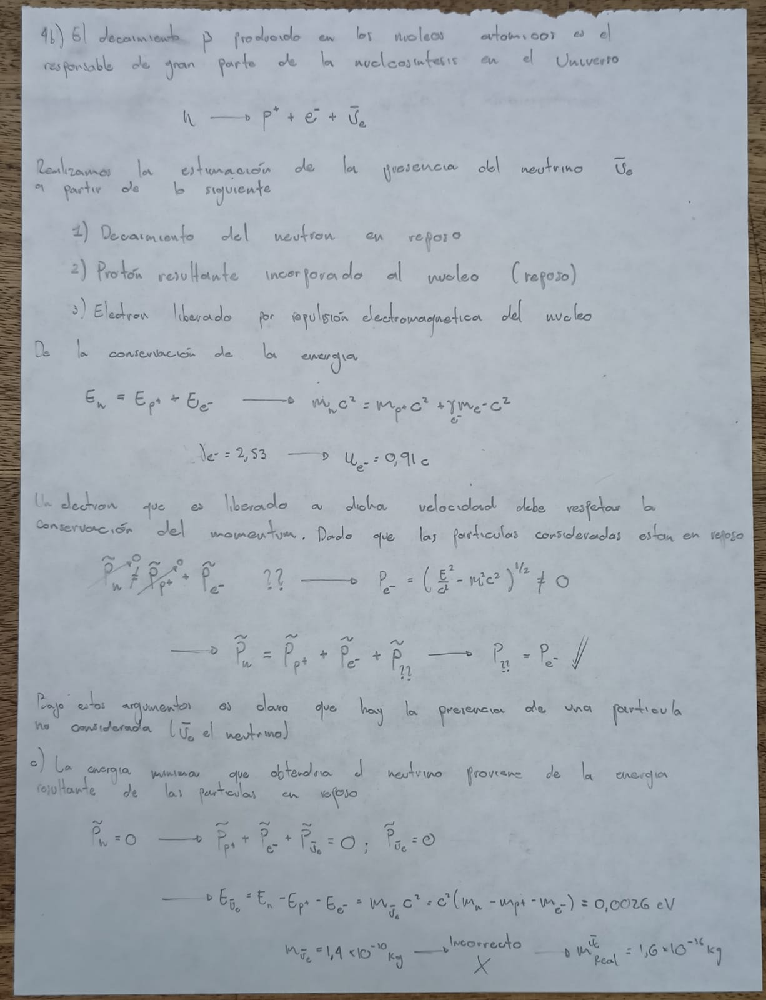

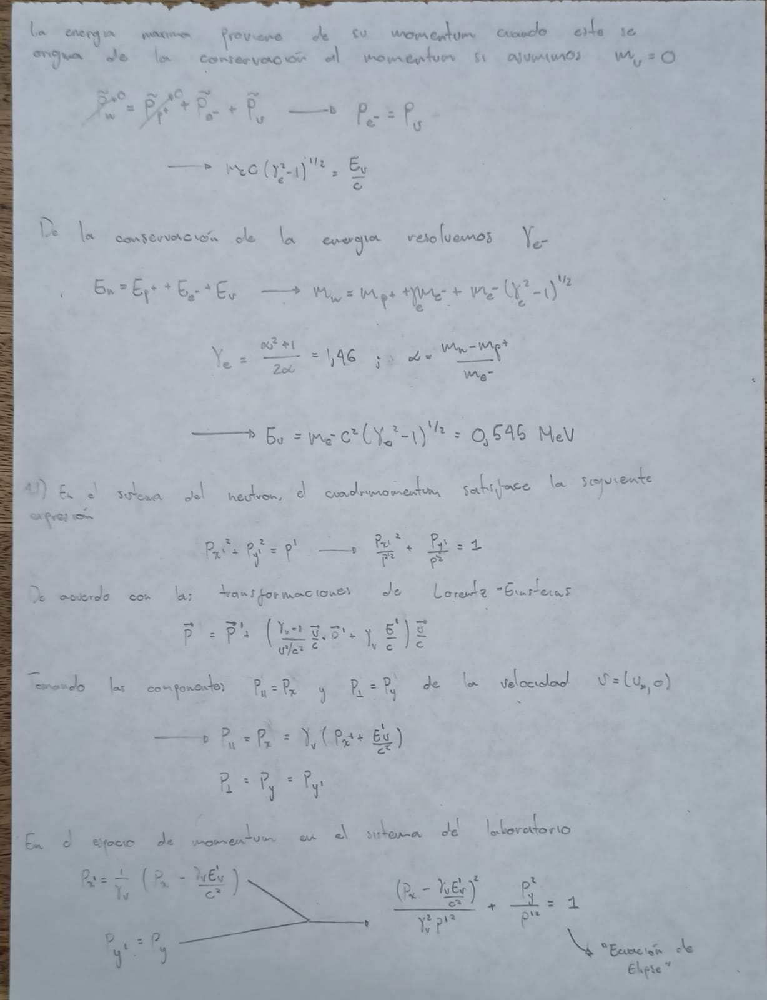

El valor de la cantidad $vE'/c^2$ determina la probabilidad con la que el electron $e^{-}$ es emitido en cierta dirección. En todos los casos se presenta que el electron tiende a emitirse con mayor probabilidad en dirección $\hat{x}$. Para el caso en que $vE'/c^2 = p$ se puede dar que el electron haya sido emitido en reposo (origen del diagrama $p_x - p_y$) respecto al sistema de laboratorio; unicamente cuando se satisface que $vE'/c^2 < p$ puede darse que el electron es emitido hacia atrás

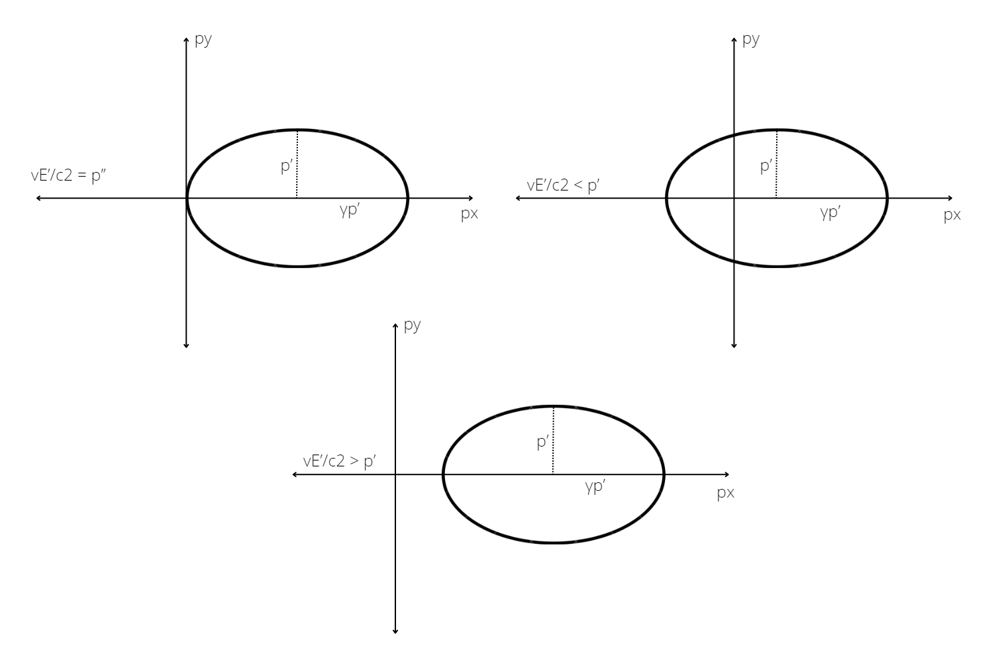